Here we import the libraries we'll use. Notice, the first time you call a command it may take a few seconds (10 or so for some) as Julia compiles it for the first time. After that it should be much faster.

In [1]:
using DifferentialEquations, Plots, Rsvg
gr()

Plots.GRBackend()

# Model and example solutions
Here we implement the gene expression model from appendix A.6 of Marchetti, Priami and Thanh, *Simulation Algorithms for Comptuational Systems Biology*, Springer (2017).

In [2]:
rn = @reaction_network gtype begin
    c1, G --> G + M
    c2, M --> M + P
    c3, M --> 0
    c4, P --> 0
    c5, 2P --> P2
    c6, P2 --> 2P
    c7, P2 + G --> P2G
    c8, P2G --> P2 + G
end c1 c2 c3 c4 c5 c6 c7 c8
rnpar = [.09, .05, .001, .0009, .00001, .0005, .005, .9]  # values of the rate constants
varlabels = ["G", "M", "P", "P2","P2G"]
u0 = [1000, 0, 0, 0,0]                                    # initial conditions
tf = 4000.                                                # end time of simulations

4000.0

Here we solve the ODEs for this network numerically using the `Tsit5` numerical method:

In [13]:
u0f = [1000., 0., 0., 0.,0.]
odeprob = ODEProblem(rn, u0f, (0.,tf),rnpar)
sol = solve(odeprob,Tsit5())
plot(sol, label=varlabels)

Below we solve for the steady-state by two methods; first we use a steady-state solver that just solves the ODEs out to a very long time. Then we use a root finder based steady-state solver.

In [8]:
ssprob = SteadyStateProblem(rn, u0f, rnpar)
ssol = solve(ssprob, DynamicSS(AutoTsit5(Rosenbrock23())))
ssol[:,end]

5-element Array{Float64,1}:
    0.896018 
   80.6416   
 4480.05     
    2.00709e5
  999.104    

In [9]:
ssprob2 = SteadyStateProblem(rn, ssol[:,end], rnpar)
ssol2 = solve(ssprob2,SSRootfind())

u: 5-element Array{Float64,1}:
    0.896011 
   80.641    
 4480.05     
    2.00709e5
  999.096    

Now let's simulate one trajectory of the corresponding stochastic model using the Gillespie's Direct method. To better see the stochasticity of the solutions I'll change the number of gene copies to be just one:

In [17]:
u0 = [1,0,0,0,0]
prob      = DiscreteProblem(u0, (0.0, tf), rnpar)
jump_prob = JumpProblem(prob, Direct(), rn)
sol       = solve(jump_prob, SSAStepper())
plot(sol,label=varlabels)

The previous simulation saved the output each time a reaction occurs. We often only want the solution at a fixed set of times. Now I'll save at 1001 evenly spaced time points, run 500 simulations, and calculate the average amount of $P$.

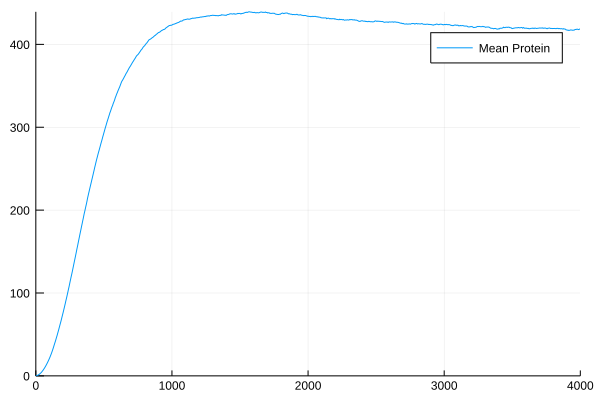

In [23]:
Nsims = 500
jump_prob = JumpProblem(prob, Direct(), rn, save_positions=(false,false))
meanprot = zeros(Int,1001)
t        = collect(0.:(tf/1000.):tf)
for i = 1:Nsims    
    sol = solve(jump_prob, SSAStepper(), saveat=tf/1000.)
    meanprot += sol[3,:]
end
meanprot /= Nsims
plot(t,meanprot,label="Mean Protein")